## はじめに
Twitterに上げたネタをやりたかっただけ。

ただ数値計算の初期条件に画像を使うといろいろ
楽になったり面白いことができるんじゃないかと思う。

今回はネタの都合上拡散方程式にしたが、
RGB を uvp に変換して2次元流体計算をしても面白いのでは？

## 参考
+ [プログラミング言語Juliaで学ぶ画像処理〜インストール、サンプル実行〜](https://lp-tech.net/articles/ZwjUh)

+ [Images のドキュメント ](http://juliaimages.github.io/latest/)

~~"Julia 画像" の google 検索結果~~

In [1]:
using Images, ImageView
using FileIO
using Plots
Plots.scalefontsizes(2)
linspace(x,y,z) = range(x, stop=y, length=z)

    

linspace (generic function with 1 method)

画像はあらかじめ用意しておく。  
(今回はペイントで適当に作った)

画像ファイルの入力とグレースケール化

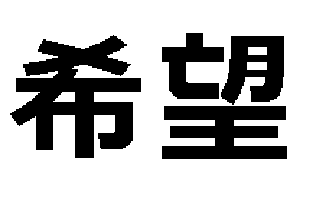

In [2]:
img = load("hopeandlegacy.bmp")
imgg = Gray.(img)
imgg
 

Plots でプロットも可能。ただしカラーバーが出ないので数値データではない？  
(内部的にどうなってるのか分かってない)

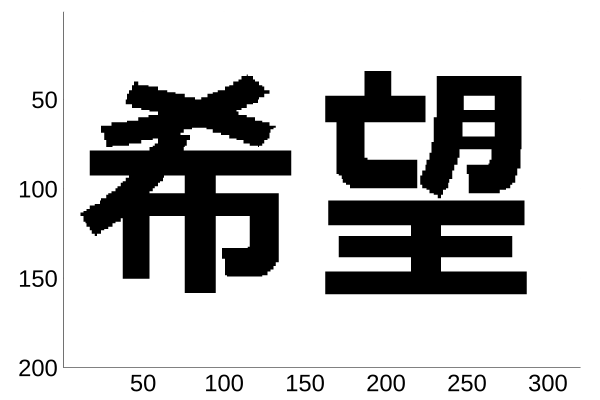

In [3]:
contour(imgg)

0を足すことで数の配列にキャストできる。  
ただし白が1,黒が0となっていることに注意。  
あとy軸が反転する。(そういえばディスプレイって左手系(？)でしたね)  
~~これがホントの希望の裏返し~~

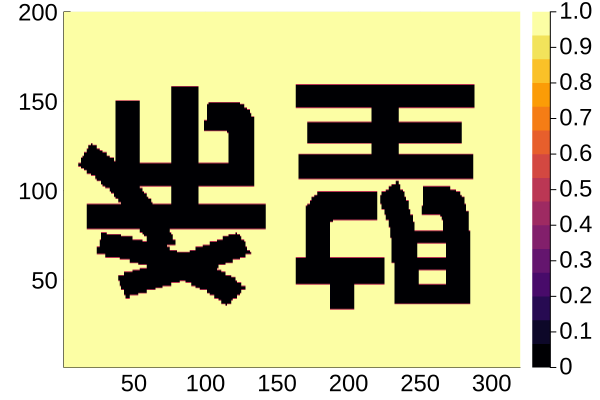

In [4]:
imgg = 0 .+ imgg
Plots.contour(imgg, fill = true)

黒部分が1になるようにして、y軸方向に反転させる。  
~~暗闇の中の希望が見える~~

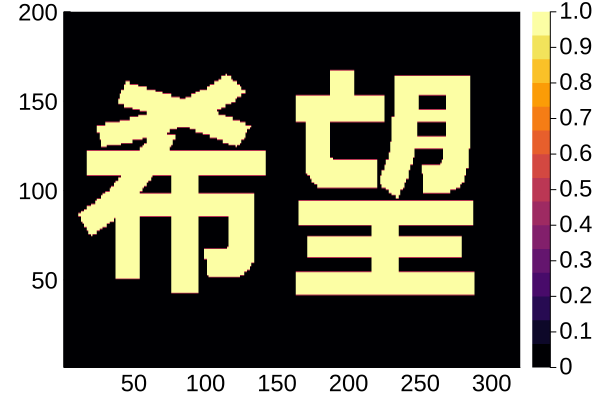

In [5]:
a = 1 .- imgg
a = a[end:-1:1,:]
contour(a, fill = true)

拡散方程式の時間発展を差分法で追う。境界条件は対称境界条件としている。  
拡散係数や格子間隔と時間ステップの比等テキトーな部分が多い。

等高線図の色は
https://docs.juliaplots.org/latest/colors/
からいい感じのものを選んだ。


In [6]:


function main(a, Tmax = 200 , dT = 2 )
    
    Ny = size(a)[1]
    Nx = size(a)[2]
    z = a
    dz = Matrix{Float32}(undef,size(z))
   
    @gif for t = 1:Tmax
        # 境界の四隅
        dz[1,1] = 0.25(z[2,1] + z[1,2 ] - 2z[1,1])
        dz[1,Nx] = 0.25(z[2,Nx] + z[1,Nx-1]-2z[1,Nx])
        dz[Ny,1] = 0.25(z[Ny-1,1]+z[Ny,2]-2z[Ny,1])
        dz[Ny,Nx] = 0.25(z[Ny-1,Nx]+z[Ny,Nx-1]-2z[Ny,Nx])

        # 境界
        for i =2:Ny-1
            dz[i,1] = 0.25(z[i+1,1] + z[i-1,1 ] + z[i, 2] - 3z[i,1])
            dz[i,Nx] = 0.25(z[i+1,Nx] + z[i-1,Nx] + z[i,Nx-1] - 3z[i,Nx])
        end
        for i =2:Nx-1
            dz[1,i] = 0.25(z[1,i+1] + z[1,i-1 ] + z[2, i] - 3z[1,i])
            dz[Ny,i] = 0.25(z[Ny,i+1] + z[Ny,i-1 ] + z[Ny-1, i] - 3z[Ny,i])
        end
        
        # バルク
        for i = 2:Ny-1
            for k = 2:Nx-1
                dz[i,k] = 0.25(z[i+1,k] + z[i-1,k] + z[i,k+1] + z[i,k-1] - 4z[i,k])
            end
        end
        
        z += dz
        contour(z,fill=true, c=:lighttest)
        zlims!((0,1))

        end every dT
end
 

main (generic function with 3 methods)

拡散方程式の部分は10秒くらいで計算が終わる(速い？遅い？)

In [7]:
@time main(a)

┌ Info: Saved animation to 
│   fn = F:\Dropbox\Notebook\GPUdiffusion\tmp.gif
└ @ Plots C:\Users\nohara\.julia\packages\Plots\UtVfv\src\animation.jl:90


12.192511 seconds (32.04 M allocations: 1.739 GiB, 3.48% gc time)


Plots.AnimatedGif("F:\\Dropbox\\Notebook\\GPUdiffusion\\tmp.gif")